## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
##  Compute the camera calibration using chessboard images

Done


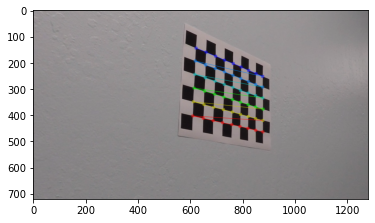

In [2]:
import sys
sys.modules[__name__].__dict__.clear()
import numpy as np
import cv2
import pickle
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from ipywidgets import interact, interactive, fixed
from moviepy.editor import VideoFileClip
from IPython.display import HTML
import moviepy as mve

%matplotlib inline
global objpoints,imgpoints

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img2 = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        #cv2.imshow('img',img)
        #cv2.waitKey(500)

        
        
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
undstor = cv2.undistort(img, mtx, dist, None, mtx)
cv2.destroyAllWindows()
print('Done')
plt.imshow(undstor)
plt.show()

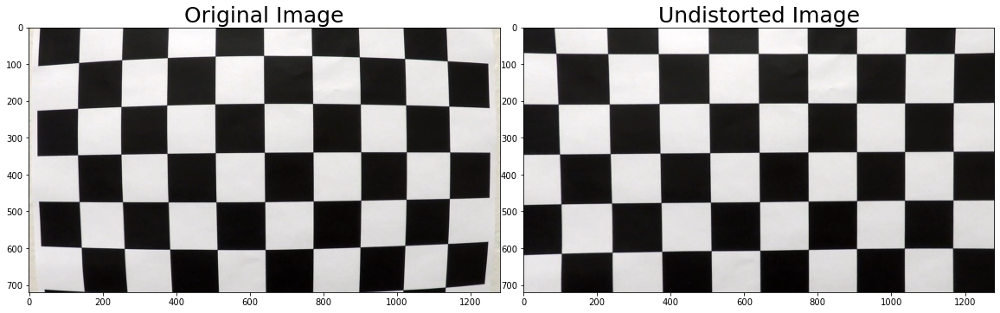

In [4]:
    # Test the calibration on the first calibration image 
    
    mpimg.imread("camera_cal/calibration1.jpg")

    img = mpimg.imread("camera_cal/calibration1.jpg")

    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[0:2], None, None)


    undstor = cv2.undistort(img, mtx, dist, None, mtx)
    
    # Plot Original and Undistorted Test Image
plt.figure(figsize=(20,50))
plt.subplots_adjust(hspace = .2, wspace=.05)

# Plot Original Test Image
plt.subplot(1,2,1)
plt.title('Original Image', fontsize=25)
fig =plt.imshow(img)

# Plot Undistorted Test Image
plt.subplot(1,2,2)
plt.title('Undistorted Image', fontsize=25)
fig =plt.imshow(undstor)


plt.savefig('output_images/Distortion_Correction.png')

## Apply a distortion correction to raw images.

Starting ....
Done


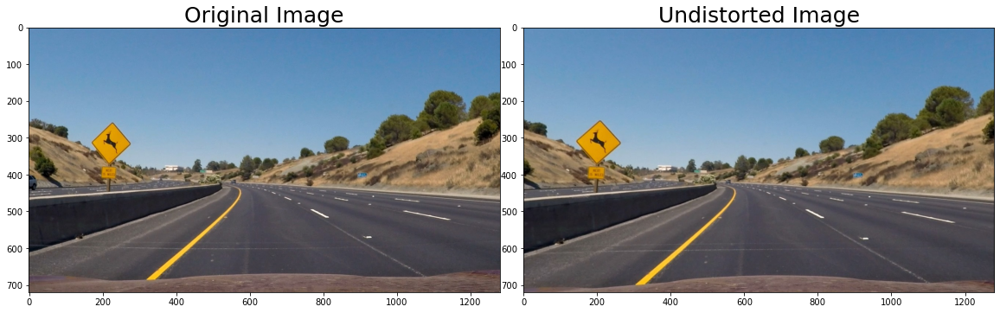

In [7]:
# Function to undistort
def cal_undist(img,objpoints, imgpoints):
    
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[0:2], None, None)

    undistorted = cv2.undistort(img, mtx, dist, None, mtx)
    
    return undistorted



images2 = glob.glob('test_images/test2.jpg')
print('Starting ....')

for fname in images2:
    img = mpimg.imread(fname)
    undstor = cal_undist(img, objpoints, imgpoints)
    cv2.imshow('img',img)
    cv2.waitKey(500)    # Plot Original and Undistorted Test Image
    plt.figure(figsize=(20,50))
    plt.subplots_adjust(hspace = .2, wspace=.05)

    # Plot Original Test Image
    plt.subplot(1,2,1)
    plt.title('Original Image', fontsize=25)
    fig =plt.imshow(img)

    # Plot Undistorted Test Image
    plt.subplot(1,2,2)
    plt.title('Undistorted Image', fontsize=25)
    fig =plt.imshow(undstor)
    
    plt.savefig('output_images/Undistorted_Raw_Image.png')
print('Done')

## Perspective transform

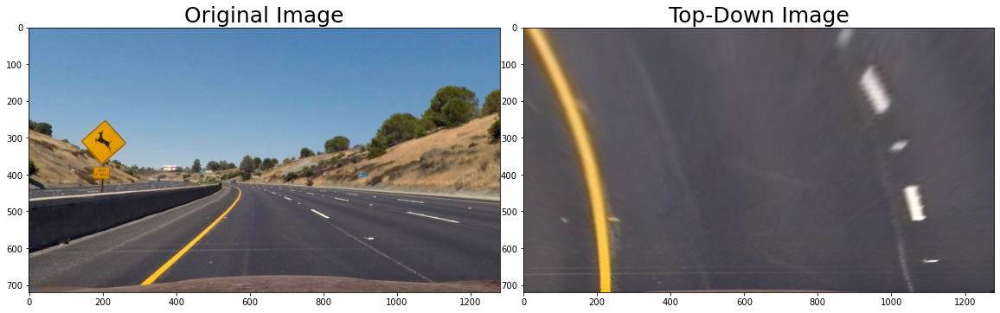

In [8]:
def Persp_trans(img):

    img_size = (img.shape[1], img.shape[0])
    
    src=np.float32([ (731,455),(570,455),(1300,690),(120,690) ])
    #c) define 4 destination points dst = np.float32([[,],[,],[,],[,]])
    dst = np.float32([[img_size[0], 0], [0, 0], 
                                     [img_size[0], img_size[1]], 
                                     [0, img_size[1]]])
    # d) use cv2.getPerspectiveTransform() to get M, the transform matrix
    M=cv2.getPerspectiveTransform(src,dst)
    Minv=cv2.getPerspectiveTransform(dst,src)

            # e) use cv2.warpPerspective() to warp your image to a top-down view
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    return warped,Minv
#Calibrating the parameters according to the straight line image 

images2 = glob.glob('test_images/test2.jpg')
#images2 = glob.glob('test_images/*.jpg')
for fname in images2:
    img = mpimg.imread(fname)
    img=cal_undist(img, objpoints, imgpoints)
    transformed,Minv=Persp_trans(img)

    plt.figure(figsize=(20,50))
    plt.subplots_adjust(hspace = .2, wspace=.05)

        # Plot Original Test Image
    plt.subplot(1,2,1)
    plt.title('Original Image', fontsize=25)
    fig =plt.imshow(img)

        # Plot Undistorted Test Image
    plt.subplot(1,2,2)
    plt.title('Top-Down Image', fontsize=25)
    fig =plt.imshow(transformed)
    plt.savefig('output_images/Perspective_Transform.png')


# Use color transforms, gradients, etc., to create a thresholded binary image.

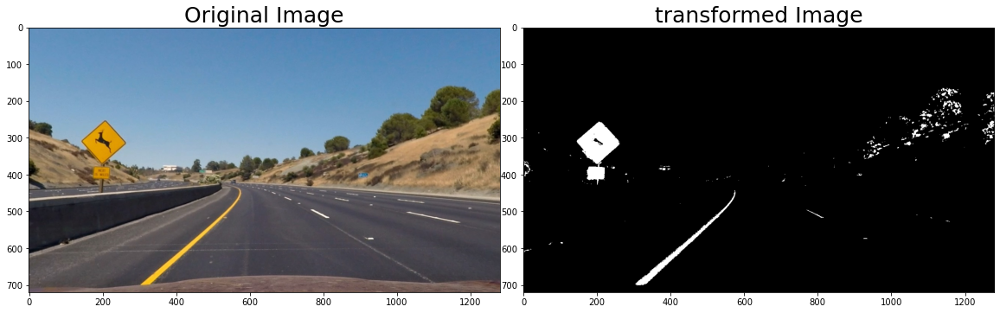

In [11]:
# HLS Threshold 

def hls_thr(img,s_thresh=(130,255),l_thresh=(0,255),h_thresh=(0,0)):
    
    #img = np.copy(img)
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    h_channel=hls[:,:,0]
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    
    # Threshold color channel
    h_binary= np.zeros_like(s_channel)
    h_binary[(h_channel >= h_thresh[0]) & (h_channel <= h_thresh[1])] = 1
    
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1

    l_binary=np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh[0]) & (l_channel<= l_thresh[1])]=1
    
    total_binary=np.zeros_like(l_channel)
    total_binary[(s_binary==1)]=1
    return total_binary
img_hls=hls_thr(img)

#img = mpimg.imread('test_images/straight_lines2.jpg')
images2 = glob.glob('test_images/test2.jpg')
for fname in images2:
    img = mpimg.imread(fname)
    #img2=Persp_trans(img)
    img=cal_undist(img, objpoints, imgpoints)
    s=hls_thr(img)
    img_hls=hls_thr(img)
    #gray = cv2.cvtColor(img_hls, cv2.COLOR_RGB2GRAY)
    ret, gray = cv2.threshold(img_hls,0,255,cv2.THRESH_BINARY)
    #gray,Minv=Persp_trans(gray)
    plt.figure(figsize=(20,50))
    plt.subplots_adjust(hspace = .2, wspace=.05)

    # Plot Original Test Image
    plt.subplot(1,2,1)
    plt.title('Original Image', fontsize=25)
    fig =plt.imshow(img)

    # Plot transformed Test Image
    plt.subplot(1,2,2)
    plt.title('transformed Image', fontsize=25)
    fig =plt.imshow(gray,cmap='gray')
    plt.savefig('output_images/Colour_transforms.png')


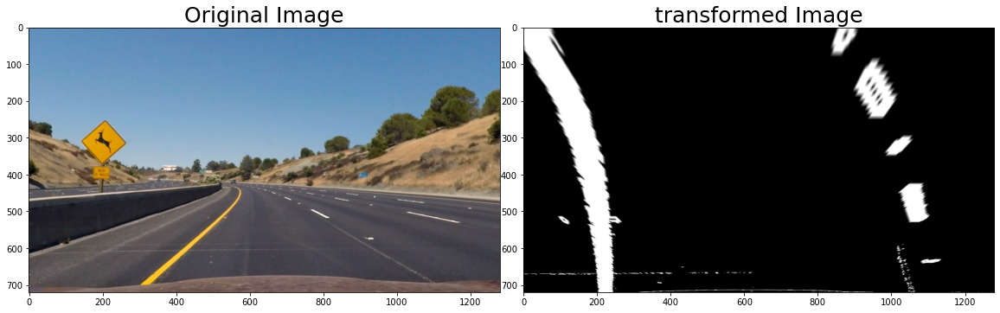

In [12]:
def sobel_thresh(img,sobel_kernel=3,sxthresh=(35,100)):

    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    #h_channel=hls[:,:,0]
    #l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(s_channel, cv2.CV_64F, 1, 0, ksize=sobel_kernel) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

    # Threshold x gradient

    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel > sxthresh[0]) & (scaled_sobel < sxthresh[1])] = 1
    return sxbinary

def mag_thresh(img, sobel_kernel=3, mag_thresh=(30,255 )):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    #hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    #h_channel=hls[:,:,0]
    #l_channel = hls[:,:,1]
    #s_channel = hls[:,:,2]
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

def dir_threshold(img, sobel_kernel=21, thresh=(-np.pi/4, np.pi/4)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output


images2 = glob.glob('test_images/test2.jpg')
for fname in images2:
    img = mpimg.imread(fname)
    #img2=Persp_trans(img)
    img=cal_undist(img, objpoints, imgpoints)
    img_hls=hls_thr(img)
    img_sx=sobel_thresh(img)
    img_mag=mag_thresh(img)
    img_dir=dir_threshold(img)
    
    combined_thr=np.zeros_like(img_sx)
    combined_thr[(img_hls==1) | (img_sx==1)|(img_mag==1) ]=1
    
    
    #gray = cv2.cvtColor(img_hls, cv2.COLOR_RGB2GRAY)
    ret, gray = cv2.threshold(combined_thr,0,255,cv2.THRESH_BINARY)
    binary_wraped,Minv=Persp_trans(gray)
    plt.figure(figsize=(20,50))
    plt.subplots_adjust(hspace = .2, wspace=.05)

    # Plot Original Test Image
    plt.subplot(1,2,1)
    plt.title('Original Image', fontsize=25)
    fig =plt.imshow(img)

    # Plot transformed Test Image
    plt.subplot(1,2,2)
    plt.title('transformed Image', fontsize=25)
    fig =plt.imshow(binary_wraped,cmap='gray')
    plt.savefig('output_images/Combined_Transform.png')


## Detect lane pixels and fit to find the lane boundary.

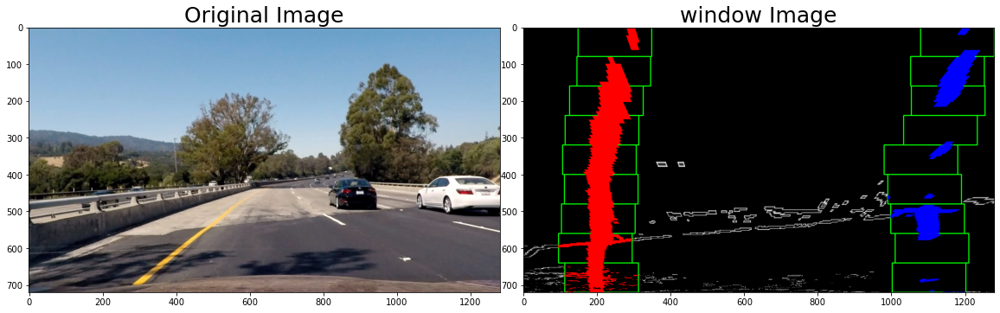

In [13]:
# Histogram usage to find the lane lines from the binary images 

def find_lane_Line(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height

        #Find the four below boundaries of the window ###
        win_xleft_low = leftx_current-margin  # Update this
        win_xleft_high = leftx_current+margin  # Update this
        win_xright_low = rightx_current-margin  # Update this
        win_xright_high = rightx_current+margin  # Update this
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        #Identify the nonzero pixels in x and y within the window ###
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        ##If you found > minpix pixels, recenter next window ###
        ### (`right` or `leftx_current`) on their mean position ###
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))


    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit a second order polynomial to each using `np.polyfit`
    if len(leftx) == 0:
        left_fit =[]
    else:
        left_fit = np.polyfit(lefty, leftx, 2)
        
    if len(rightx) == 0:
        right_fit =[]
    else:
        right_fit = np.polyfit(righty, rightx, 2)
    
    
    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
   
    return left_fit, right_fit, ploty, leftx, lefty, rightx, righty, out_img


images2 = glob.glob('test_images/test4.jpg')
for fname in images2:
    img = mpimg.imread(fname)
    img=cal_undist(img, objpoints, imgpoints)
    #img2=Persp_trans(img)
    img_hls=hls_thr(img)
    img_sx=sobel_thresh(img)
    img_mag=mag_thresh(img)
    img_dir=dir_threshold(img)
    
    combined_thr=np.zeros_like(img_sx)
    combined_thr[(img_hls==1) | (img_sx==1)|(img_mag==1) ]=1
    
    
    #gray = cv2.cvtColor(img_hls, cv2.COLOR_RGB2GRAY)
    ret, gray = cv2.threshold(combined_thr,0,255,cv2.THRESH_BINARY)
    
    binary_wraped,Minv=Persp_trans(gray)
    
    left_fit, right_fit, ploty, leftx, lefty, rightx, righty, out_img= find_lane_Line(binary_wraped)

    plt.figure(figsize=(20,50))
    plt.subplots_adjust(hspace = .2, wspace=.05)

    # Plot Original Test Image
    plt.subplot(1,2,1)
    plt.title('Original Image', fontsize=25)
    fig =plt.imshow(img)

    #Plot transformed Test Image
    plt.subplot(1,2,2)
    plt.title('window Image', fontsize=25)
    fig =plt.imshow(out_img)
    plt.savefig('output_images/Lane_Detection_MW.png')


## Finding the Curvature of the lane lines

In [14]:
# defining a function to find the curveature of the lane lines

def measure_curvature_real(img,ploty,leftx,rightx,lefty,righty):
    '''
    Calculates the curvature of polynomial functions in pixels.
    '''
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    
    # Calculation of R_curve (radius of curvature)
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    max_y=img.shape[0]
    
    left_lane_pos=left_fit_cr[0]*(max_y*ym_per_pix)**2 + left_fit_cr[1]*(max_y*ym_per_pix) +left_fit_cr[2]
    right_lane_pos=right_fit_cr[0]*(max_y*ym_per_pix)**2 + right_fit_cr[1]*(max_y*ym_per_pix) +right_fit_cr[2]
    
    d_centre_img= (img.shape[1]/2)*xm_per_pix
    
    d_centre_car=(left_lane_pos+right_lane_pos)/2
    
    D=d_centre_img-d_centre_car
    
    return left_curverad, right_curverad,D


# Calculate the radius of curvature in pixels for both lane lines
left_curverad, right_curverad,D = measure_curvature_real(img,ploty,leftx,rightx,lefty,righty)

print(left_curverad,'m', right_curverad,'m')

727.4323342109782 m 401.5060262049393 m


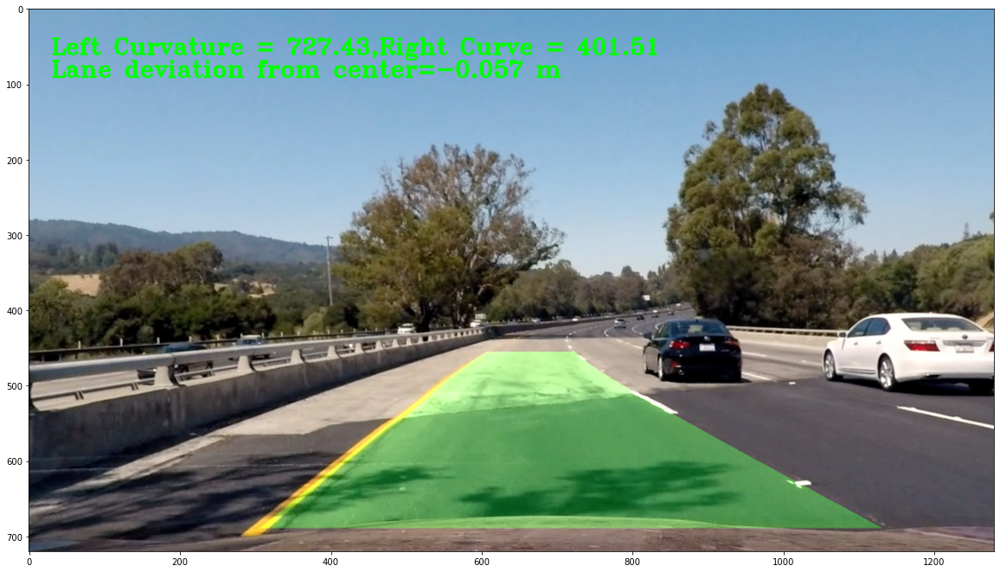

In [24]:
# Draw lanes on the original image 
def Draw_on_Lane(binary_wraped,left_fit,right_fit,ploty,Minv,Undistored_img,left_curverad, right_curverad,D):
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_wraped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (Undistored_img.shape[1], Undistored_img.shape[0])) 
    
    
    # Combine the result with the original image
    result = cv2.addWeighted(Undistored_img, 1, newwarp, 0.3, 0)

    # Text of the Curvature and Distance to centre
    curvature_text = "Left Curvature = " + str(np.round(left_curverad, 2)) + ",Right Curve = " + str(np.round(right_curverad, 2))
    font = cv2.FONT_HERSHEY_TRIPLEX    
    cv2.putText(result, curvature_text, (30, 60), font, 1, (0,255,0), 2)
    deviation_text = "Lane deviation from center={:.3f} m".format(D) 
    font = cv2.FONT_HERSHEY_TRIPLEX
    cv2.putText(result, deviation_text, (30, 90), font, 1, (0,255,0), 2)
    return result

#Find the Curvature and Distance to the Centre of the Lane 
left_curverad, right_curverad,D = measure_curvature_real(img,ploty,leftx,rightx,lefty,righty)

#Draw the Lane Area on the original image
result=Draw_on_Lane(binary_wraped,left_fit,right_fit,ploty,Minv,img,left_curverad, right_curverad,D)
plt.figure(figsize=(20,50))
fig =plt.imshow(result)
plt.savefig('output_images/Finding_Lane_Curve_Centre.png')


## Run the whole Pipeline on all test images

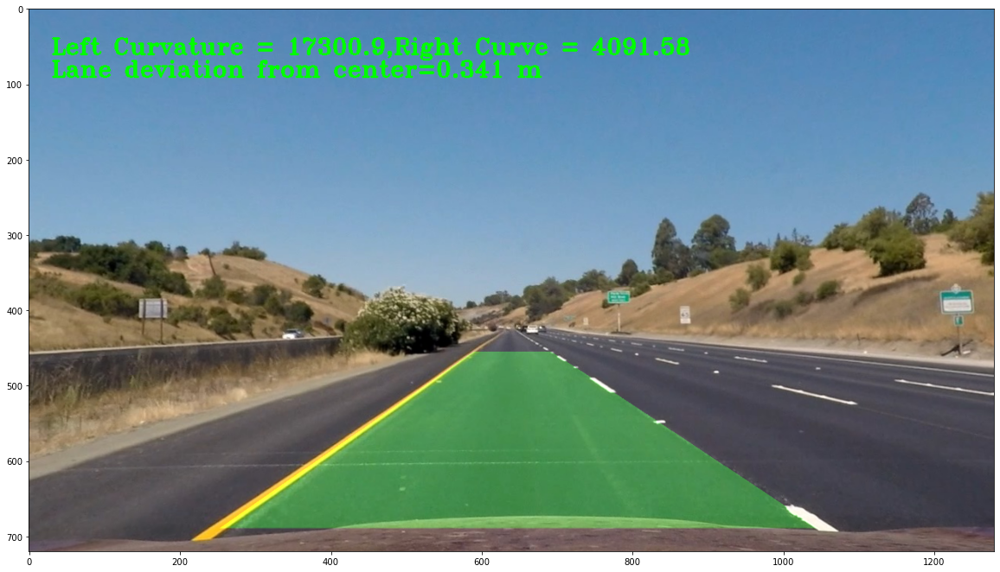

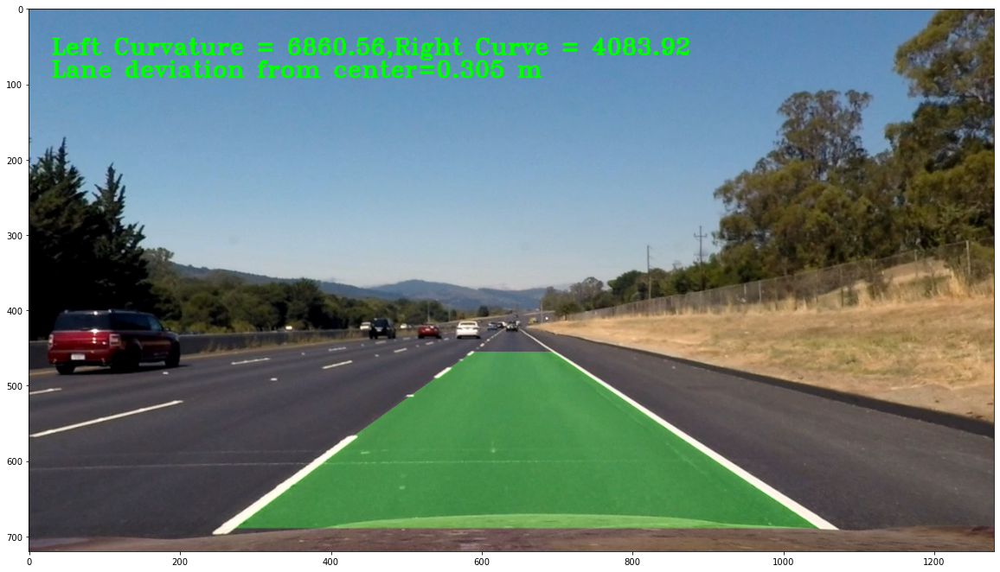

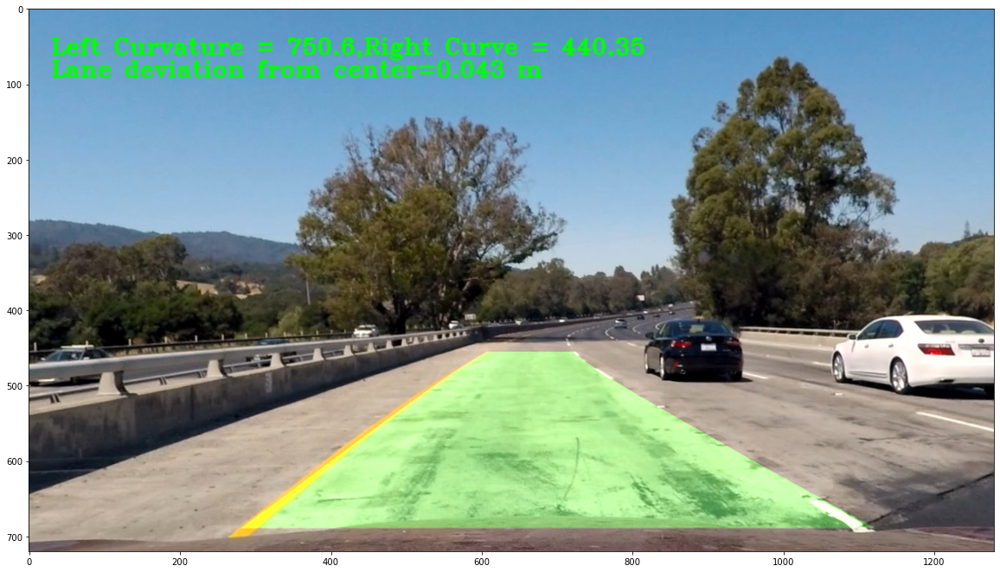

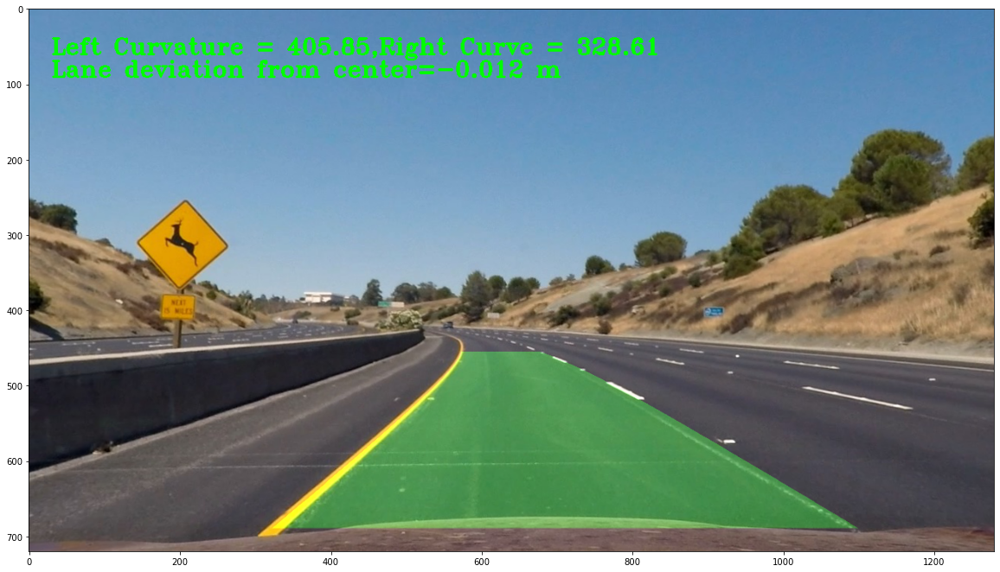

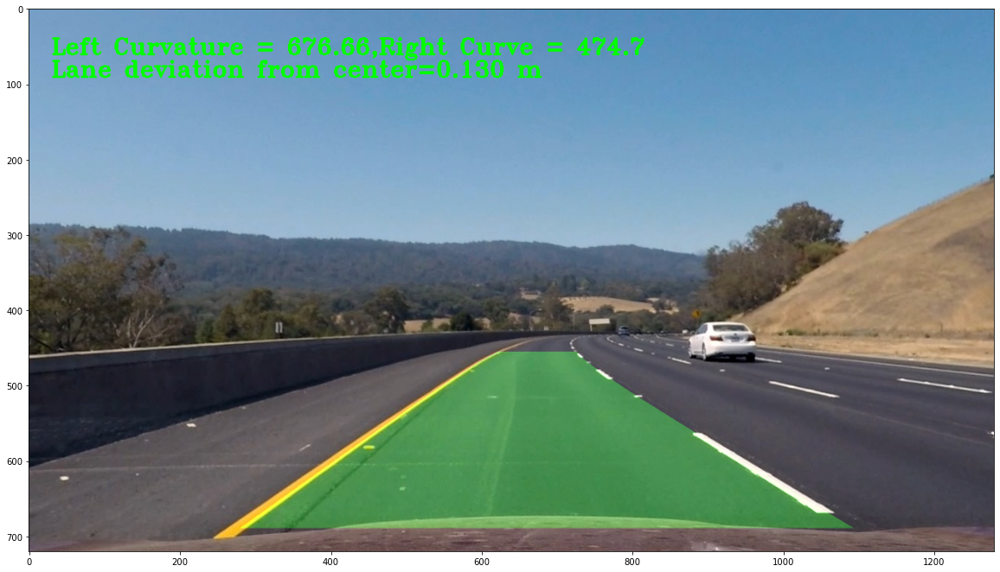

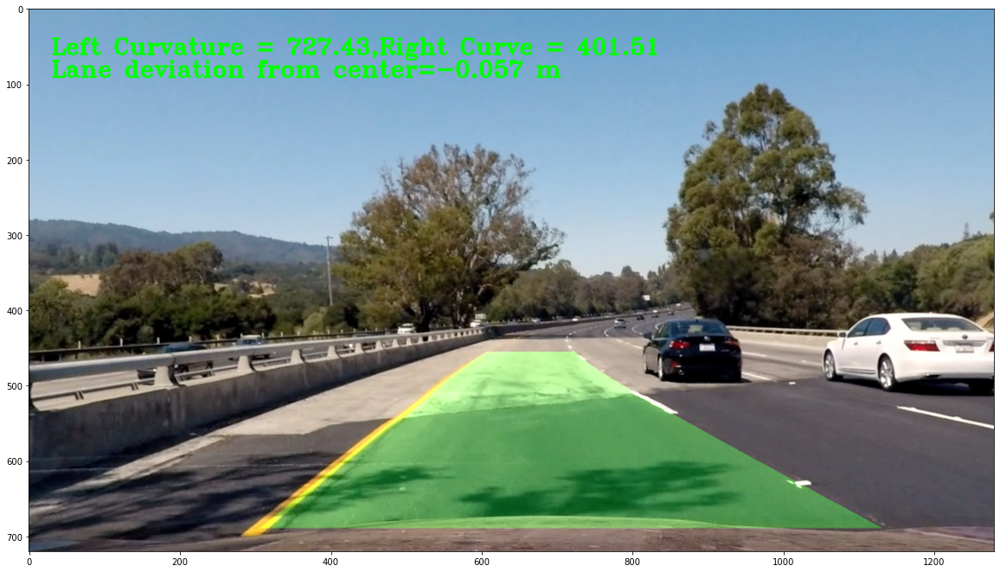

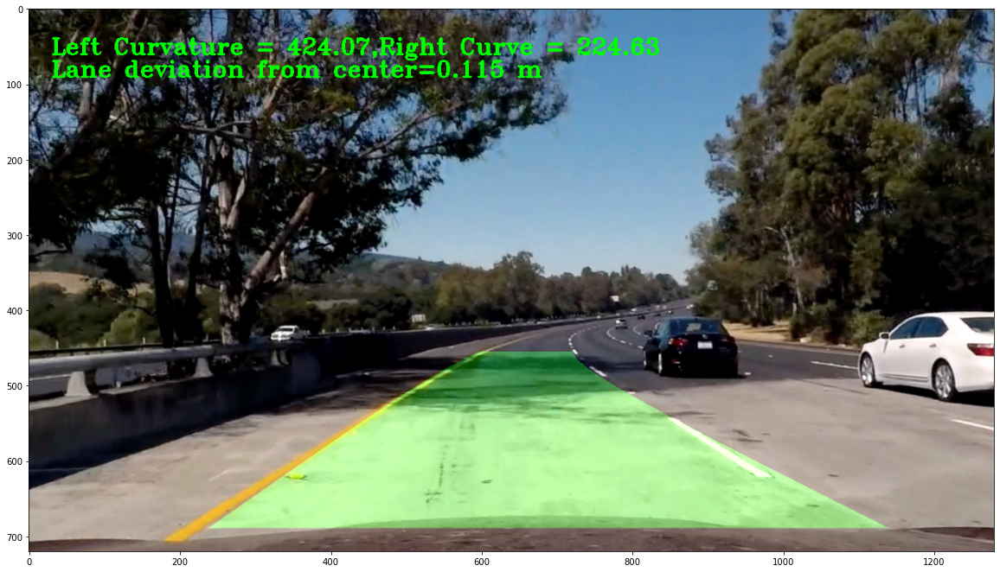

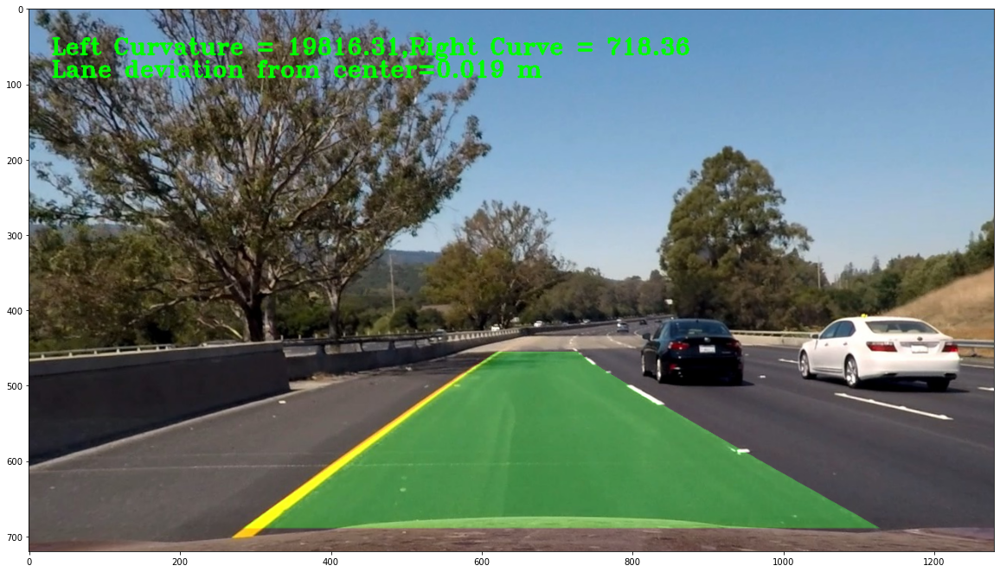

Done!!


In [25]:
def Run_pipeline(img):

    img=cal_undist(img, objpoints, imgpoints)
    #run the color and gradient thresholds
    img_hls=hls_thr(img)
    img_sx=sobel_thresh(img)
    img_mag=mag_thresh(img)
    img_dir=dir_threshold(img)
    combined_thr=np.zeros_like(img_sx)
    combined_thr[(img_hls==1) | (img_sx==1)|(img_mag==1) ]=1
    ret, gray = cv2.threshold(combined_thr,0,255,cv2.THRESH_BINARY)
    #get the prespective (TOP-View)
    binary_wraped,Minv=Persp_trans(gray)
    
    #Find the Lane Lines
    left_fit, right_fit, ploty, leftx, lefty, rightx, righty, out_img= find_lane_Line(binary_wraped)
    
    #Find the Curvature and Distance to the Centre of the Lane 
    left_curverad, right_curverad,D = measure_curvature_real(img,ploty,leftx,rightx,lefty,righty)

    #Draw the Lane Area on the original image
    result=Draw_on_Lane(binary_wraped,left_fit,right_fit,ploty,Minv,img,left_curverad, right_curverad,D)
    return result

images = glob.glob('test_images/*.jpg')

for fname in images:
    img = mpimg.imread(fname)
    
    #Undistort the image 
    result=Run_pipeline(img)
    plt.figure(figsize=(20,50))
    plt.imshow(result)
    plt.show()
print("Done!!")

## Testing the Pipeline on a Test Video 

In [620]:
video_output = "output_Video/project_video.mp4"
clip1 = VideoFileClip("project_video.mp4")
clip1_output = clip1.fl_image(Run_pipeline)
%time clip1_output.write_videofile(video_output, audio=False)

t:   0%|                                                                            | 0/1260 [00:00<?, ?it/s, now=None]

Moviepy - Building video output_Video/project_video.mp4.
Moviepy - Writing video output_Video/project_video.mp4




t:  11%|██████▉                                                           | 133/1260 [02:21<19:54,  1.06s/it, now=None]


t:  21%|█████████████▉                                                    | 265/1260 [04:41<18:12,  1.10s/it, now=None]


t:  32%|████████████████████▊                                             | 397/1260 [07:05<20:55,  1.46s/it, now=None]


t:  42%|███████████████████████████▋                                      | 529/1260 [09:27<13:13,  1.09s/it, now=None]


t:  52%|██████████████████████████████████▌                               | 661/1260 [11:48<10:33,  1.06s/it, now=None]


t:  63%|█████████████████████████████████████████▌                        | 793/1260 [14:11<08:25,  1.08s/it, now=None]


t:  73%|████████████████████████████████████████████████▍                 | 925/1260 [16:35<06:00,  1.08s/it, now=None]


t:  84%|██████████████████████████████████████████████████████▌          | 1057/1260 [18:58<03:43,  1.10s/it, now=None]


t:  94%|█████████████████████████████████████████████████████████████▎   | 1189/1260 [21:20<01:16,  1.08s/it, now=None]


t:   0%|                                                                    | 2/1260 [23:43<11:06,  1.89it/s, now=None]

Moviepy - Done !
Moviepy - video ready output_Video/project_video.mp4
Wall time: 22min 41s


In [3]:
# Display the video 
from IPython.display import HTML
video_output = "output_Video/project_video.mp4"

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_output))

In [66]:
video_output = "output_Video/challenge_video_out.mp4"
clip1 = VideoFileClip("challenge_video.mp4")
clip1_output = clip1.fl_image(Run_pipeline)
%time clip1_output.write_videofile(video_output, audio=False)

t:   0%|                                                                                                                                                                        | 0/485 [00:00<?, ?it/s, now=None]

Moviepy - Building video output_Video/challenge_video_out.mp4.
Moviepy - Writing video output_Video/challenge_video_out.mp4




t:  16%|█████████████████████████▏                                                                                                                                     | 77/485 [01:16<06:47,  1.00it/s, now=None]


t:  22%|██████████████████████████████████▌                                                                                                                           | 106/485 [01:45<06:21,  1.01s/it, now=None]

KeyboardInterrupt: 

In [4]:
from IPython.display import HTML
video_output = "output_Video/challenge_video_out.mp4"

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_output))